# Семинар 4 - Интерполяция изображений, геометрия формирования изображения и калибровка камеры

***

In [1]:
from pathlib import Path

import cv2
import skimage
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

# Интерполяция изображений

![](data/interpolation.svg)
Задача - эффективно уменьшить/увеличить изображение.

Рассмотрим несколько методов интерполяции.

## а) Интерполяция по ближайшему пикселю

![](data/inter_nearest.png)

Самая простая и самая быстрая, однако она приводит к сильным артефактам.

## б) Билинейная интерполяция

![](data/inter_linear.png)

Лучше по качеству, но требует больше вычислений и вдобавок размывает границы объектов.

## в) Бикубическая интерполяция

![](data/inter_cubic.png)

Еще лучше в непрерывных областях, но на границе возникает [эффект гало](https://ru.wikipedia.org/wiki/Гало) (более темная полоса вдоль темного края границы и светлая вдоль светлого).

## Примеры

Согласно [документации OpenCV](https://docs.opencv.org/3.4/da/d54/group__imgproc__transform.html) для **сжатия изображения** — наиболее предпочтительным методом интерполяции является `cv.INTER_AREA`,
**для увеличения изображения** — наиболее предпочтительны методы интерполяции: `cv.INTER_CUBIC` (медленный) и `cv.INTER_LINEAR`.

In [2]:
interpolation_algorithm = [
    ("nearest", cv2.INTER_NEAREST),
    ("bilinear", cv2.INTER_LINEAR),
    ("bicubic", cv2.INTER_CUBIC),
    ("area", cv2.INTER_AREA),
    ("lanczos4", cv2.INTER_LANCZOS4)
]

def resize_by_factor(
    img: np.array,
    factor: float,
) -> None:

    height, width = img.shape[:2]
    height2, width2 = int(height*factor), int(width*factor)

    print(f'orig size: h={height}, w={width}, resised size: h={height2}, w={width2}')

    fig, axes = plt.subplots(
        nrows=len(interpolation_algorithm),
        sharex=True,
        sharey=True,
        figsize=(3, 20)
    )

    imgs = []
    for i in range(len(interpolation_algorithm)):

        img_resized = cv2.resize(
            src=img,
            dsize=(width2, height2),
            interpolation=interpolation_algorithm[i][1],
        )

        axes[i].imshow(img_resized, cmap='Greys_r')
        axes[i].set_title(
            f"{interpolation_algorithm[i][0]}, shape = {img_resized.shape}",
        )

### Оригинальное изображение

Text(0.5, 1.0, 'Original image, shape = (50, 50)')

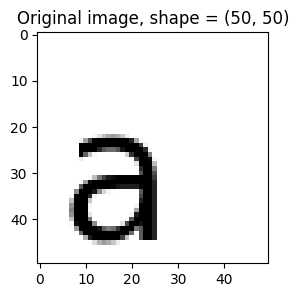

In [3]:
IMG_PATH = "data/a_letter.png"
# IMG_PATH = "/content/data/a_letter.png"

if not Path(IMG_PATH).exists():
    !git clone https://github.com/alexmelekhin/cv_course_2023.git
    !mv cv_course_2023/seminars/seminar_04/data .

a_letter_img = cv2.imread(IMG_PATH, cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(3, 3))
plt.imshow(a_letter_img, cmap="Greys_r")
plt.title(f"Original image, shape = {a_letter_img.shape}")

### Увеличение

orig size: h=50, w=50, resised size: h=250, w=250


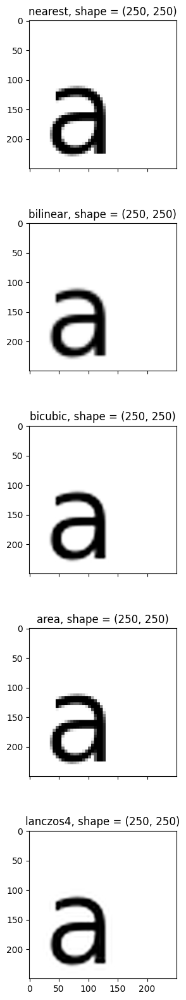

In [4]:
resize_by_factor(
    img=a_letter_img,
    factor=5,
)

### Уменьшение

orig size: h=50, w=50, resised size: h=25, w=25


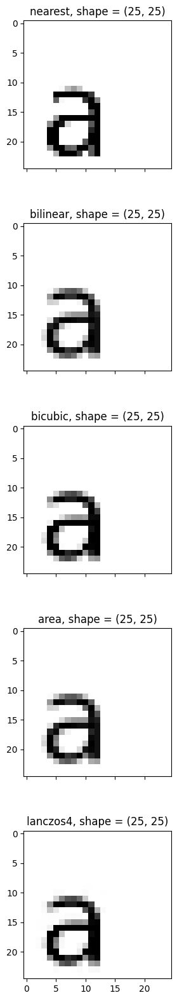

In [5]:
resize_by_factor(
    img=a_letter_img,
    factor=0.5,
)

# Упражение 1

Можно ли реализовать сжатие изображений на свертках? Реализуйте свертку, которая будет уменьшать изображение в 2 раза.

Размер изображения после свёртки с шагом 2: (25, 25) 
Размер изображения после свёртки с шагом 1: (50, 50)


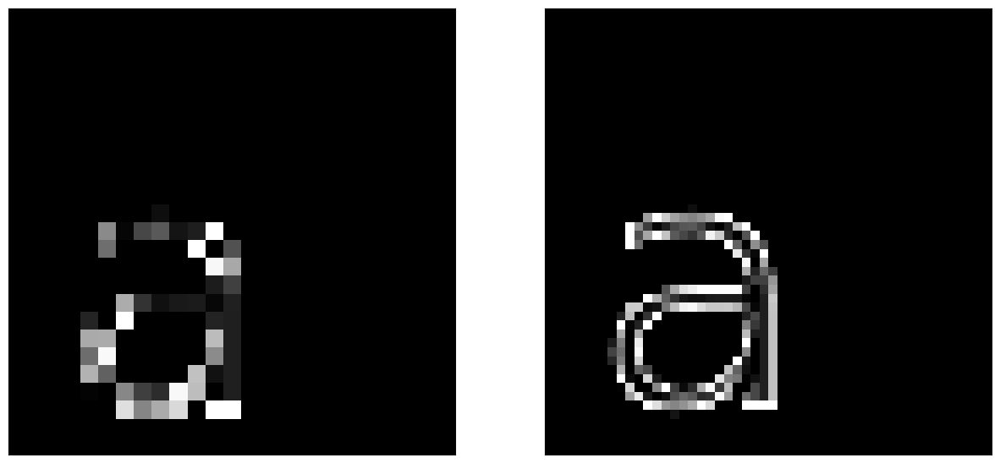

In [7]:
# your code here

def my_conv2d(img, kernel, out_channels=1, bias=0, stride=[1, 1], padding=1):

    height, width = img.shape[-2], img.shape[-1]
    k_height, k_width = kernel.shape[-2], kernel.shape[-1]
    height_out = (height - k_height + 2 * padding) // stride[-2] + 1
    width_out = (width - k_width + 2 * padding) // stride[-1] + 1
    output = np.zeros((height_out, width_out))
    if padding != 0:
        img = np.insert(arr=img, obj=[0, img.shape[-2]], values=np.zeros(img.shape[-1])[0],
                  axis=0)
        img = np.insert(arr=img, obj=[0, img.shape[-1]], values=np.zeros(img.shape[-2])[0],
                  axis=1)

    for row in range(output.shape[0]):
        for col in range(output.shape[1]):
            output[row, col] = np.sum(np.multiply(img[row*stride[0]:row*stride[0]+k_height,
                                      col*stride[1]:col*stride[1]+k_width], kernel)) + bias

    return np.clip(output, 0, 255).astype(np.uint8)

# img = cv2.cvtColor(src=skimage.data.chelsea(), code=cv2.COLOR_RGB2GRAY)
kernel = np.array([[0, 1, 0],
                   [1, -4, 1],
                   [0, 1, 0]])

conv_resize_img = my_conv2d(a_letter_img, kernel, stride=[2, 2])
conv_img = my_conv2d(a_letter_img, kernel, stride=[1, 1])

plt.figure(figsize=(15, 15))

plt.subplot(121)
plt.imshow(conv_resize_img, cmap='gray')
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(conv_img, cmap='gray')
plt.xticks([])
plt.yticks([])

print(f"""Размер изображения после свёртки с шагом 2: {conv_resize_img.shape}
Размер изображения после свёртки с шагом 1: {conv_img.shape}""")

# Трансформация изображений

[Туториал OpenCV "Geometric Transformations of Images"](https://docs.opencv.org/3.4/da/d6e/tutorial_py_geometric_transformations.html)

![](data/image_transformations.png)
_Источник - [Computer Vision: Algorithms and Applications, 2nd ed. 2022 Richard Szeliski](https://szeliski.org/Book/)_

## Поворот (Rotation)

Входные параметры: угол поворота (angle)

```python
matrix = np.array([
      [np.cos(angle),  np.sin(angle), 0],
      [-np.sin(angle), np.cos(angle), 0],
      [0,              0,             1],
])
```

## Растяжение/сжатие (Scale)

Входные параметры: фактор растяжения (tx, ty)

```python
matrix = np.array([
      [t[0], 0,    0],
      [0,    t[1], 0],
      [0,    0,    1],
])
```

## Перенос (translation)

Входные параметры: фактор переноса (tx, ty)

```python
matrix = np.array([
      [1,  0, t[0]],
      [0,  1, t[1]],
      [0,  0,    1],
])
```

## Сдвиг (shearing)

Входные параметры: фактор сдвига (tx, ty)

```python
matrix_horisontal = np.array([
      [1,    t[0], 0],
      [t[1], 1,    0],
      [0,    0,    1],
])
```


# Упражнение 2

Реализуйте функцию, которая принимает изображение и матрицу преобразования, и реализует афинную трансформацию. Не забудьте про центрирование.

Идея - афинное перемещение пикселей изображения.

In [8]:
def affine_transform(
    img: np.array,
    mat: np.array,
) -> np.array:

    # transfromed image
    transformed_img = np.zeros_like(img)

    # image shape
    H, W = img.shape[:2]

    # center of the img
    cy, cx = (H + 1) // 2 - 1, (W + 1) // 2 - 1

    for y in range(H):
        for x in range(W):
            # your code here
            # 3-й элемент равен -1, т.к. хотелось чтобы в Translation при
            # положительных значениях tx, ty изображение съезжало вправо и вниз,
            # как в реализации opencv. Также y и x, cy и cx поменял местами, это
            # сделано для более очевидной интуиции при подаче параметров (в массиве,
            # который подаётся на вход, на первом месте должна стоять координата X,
            # а на втором месте - Y). При подаче угла, его нужно перевести в радианы
            # и подавать на вход в виде списка или кортежа (хотя это тоже можно было поменять)
            vec_x = np.array([x - cx, y - cy, -1])
            vec_y = np.array([x - cx, y - cy, -1])

            new_x = int(mat[0, :] @ vec_x + cx)
            new_y = int(mat[1, :] @ vec_y + cy)

            # проверка на то, чтобы новые координаты находились в пределах высоты
            # и ширины изображения
            if 0 <= new_x < H and 0 <= new_y < W:
                transformed_img[y, x] = img[new_y, new_x]

    return transformed_img

def make_rotation(
    params,
) -> np.array:

    angle = params[0]
    # your code here

    mat = np.array([[np.cos(angle),  np.sin(angle), 0],
                    [-np.sin(angle), np.cos(angle), 0],
                    [0,              0,             1]

    ])

    return mat

def make_scaling(
    params,
) -> np.array:

    tx, ty = params[0], params[1]
    # your code here

    mat = np.array([[tx,   0,    0],
                    [0,    ty,   0],
                    [0,    0,    1]
    ])

    return mat

def make_translation(
    params,
) -> np.array:

    tx, ty = params[0], params[1]
    # your code here

    mat = np.array([[1,  0, tx],
                    [0,  1, ty],
                    [0,  0,  1]
    ])

    return mat

def make_shearing(
    params,
) -> np.array:

    tx, ty = params[0], params[1]
    # your code here

    mat = np.array([[1,  tx, 0],
                    [ty,  1, 0],
                    [0,   0, 1]
    ])

    return mat

Проверьте код на примере изображения c астронавтом

interactive(children=(FloatSlider(value=1.0, description='tx', max=3.14, min=-3.14, step=0.01), FloatSlider(va…

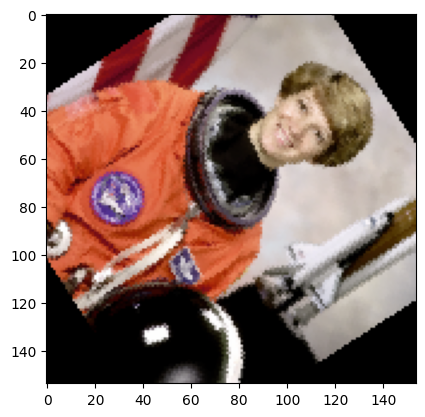

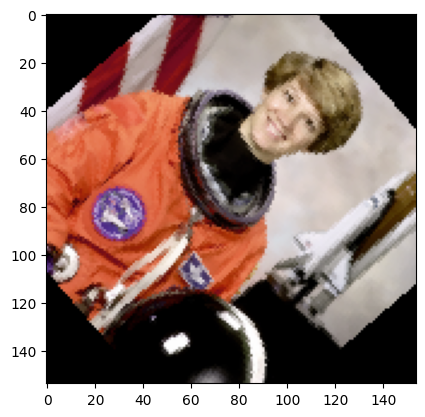

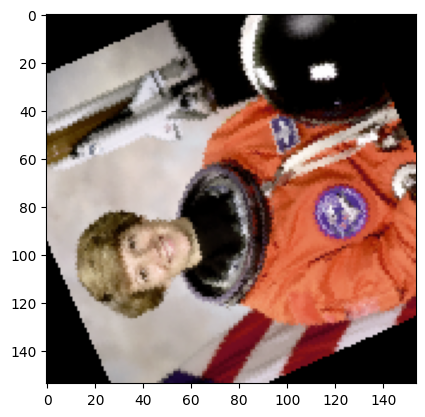

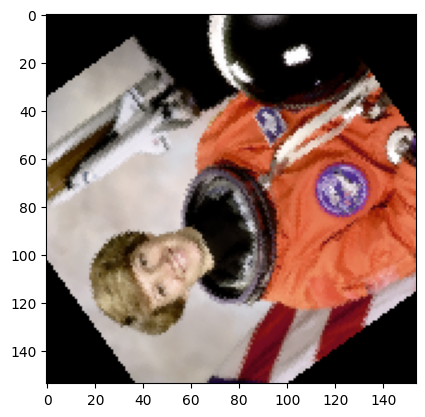

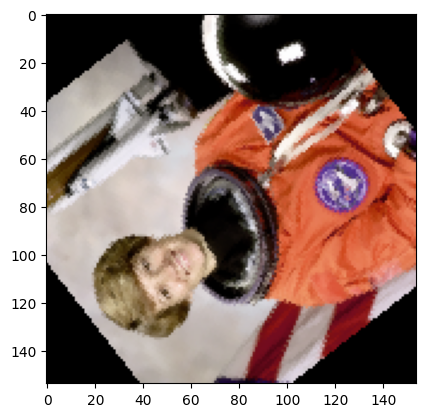

...

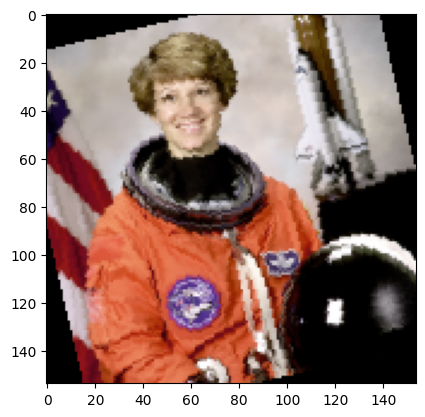

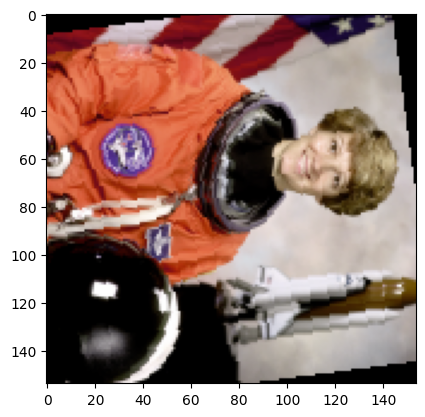

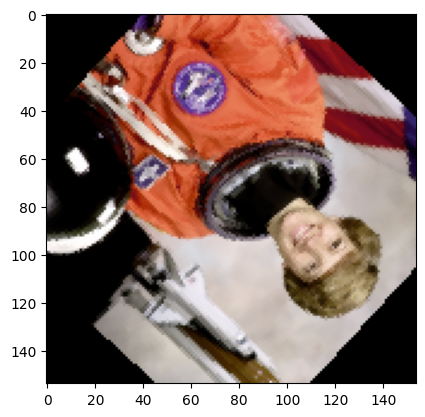

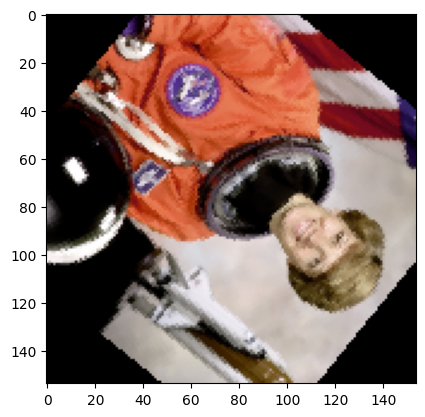

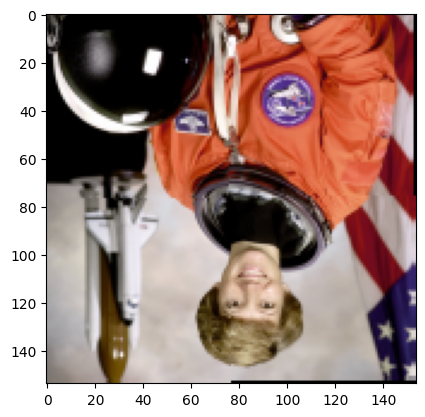

In [9]:
import ipywidgets
from skimage import data

img = data.astronaut()

#resize image for much faster affine processing
img = cv2.resize(
    src=img,
    dsize = None,
    fx=0.3,
    fy=0.3,
    interpolation=cv2.INTER_AREA,
)

@ipywidgets.interact(
    tx=ipywidgets.FloatSlider(
        min=-3.14, max=3.14,
        step=0.01, value=1.,
    ),

    ty=ipywidgets.FloatSlider(
        min=-3.14, max=3.14,
        step=0.01, value=1.,
    ),
    angle=ipywidgets.FloatSlider(
        min=-3.14, max=3.14,
        step=0.01, value=1.,
    ),
)
def play_with_params(
    tx: float,
    ty: float,
) -> None:
    params = [tx, ty]
    # an example
    mat = make_rotation(
        (params),
    )

    transformed_img = affine_transform(
        img=img,
        mat=mat
    )

    plt.imshow(transformed_img)

# Вопрос 1

Запустите все 4 преобразования. Изменяйте параметры алгоритма. Имеются ли пиксели, которые никуда не перешли в результате трансформации?

**Ответ:** При повороте, масштабировании и сдвиге остаётся на месте центральный пиксель изображения. При переносе (translation) все пиксели перемещаются относительно своих изначальных положений.

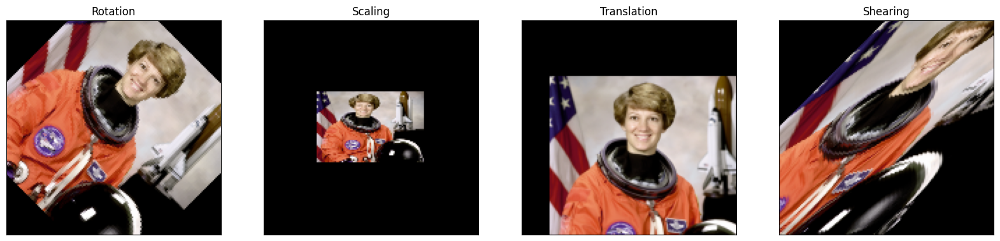

In [10]:
#your code here

angle = np.radians(45)
sc_params = [2, 3]
tr_params = [20, 40]
sh_params = [1, 0.3]

rot_mat = make_rotation((angle,))
sc_mat = make_scaling(sc_params)
tr_mat = make_translation(tr_params)
sh_mat = make_shearing(sh_params)

rot_img = affine_transform(img=img, mat=rot_mat)
sc_img = affine_transform(img=img, mat=sc_mat)
tr_img = affine_transform(img=img, mat=tr_mat)
sh_img = affine_transform(img=img, mat=sh_mat)

plt.figure(figsize=(20, 40))

plt.subplot(141)
plt.imshow(rot_img)
plt.xticks([])
plt.yticks([])
plt.title("Rotation")

plt.subplot(142)
plt.imshow(sc_img)
plt.xticks([])
plt.yticks([])
plt.title("Scaling")

plt.subplot(143)
plt.imshow(tr_img)
plt.xticks([])
plt.yticks([])
plt.title("Translation")

plt.subplot(144)
plt.imshow(sh_img)
plt.xticks([])
plt.yticks([])
plt.title("Shearing");

My translation is equal to the implementation from opencv!


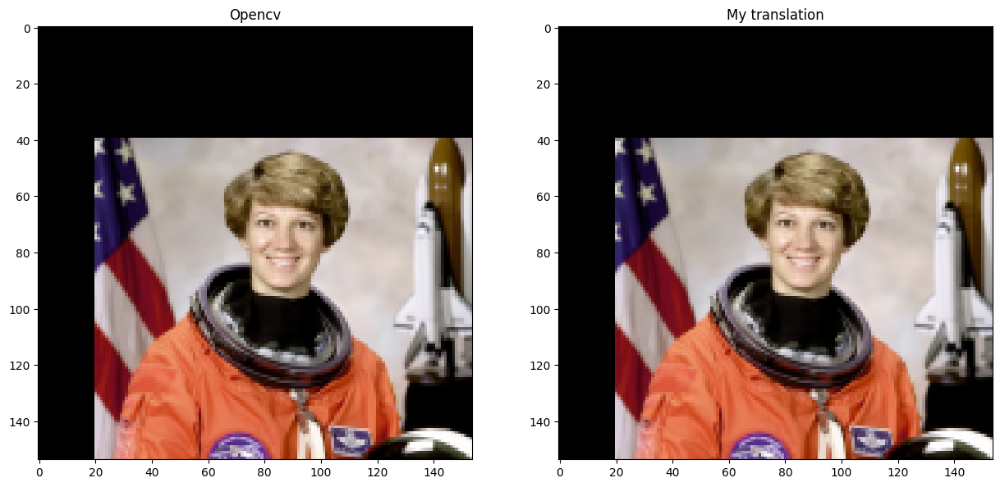

In [11]:
# Проверка на то, что функция Translation работает, как в opencv. По другим
# функциям интуитивно понятно, что они работают так, как нам и хотелось
rows, cols, _ = img.shape
M = np.float32([[1, 0, 20],
                [0, 1, 40]])
dst = cv2.warpAffine(img, M, (cols, rows))

if dst.shape[0] == tr_img.shape[0] and dst.shape[1] == tr_img.shape[1]:
    cnt = 0
    for row in range(dst.shape[0]):
        for col in range(dst.shape[1]):
            for ch in range(dst.shape[2]):
                if dst[row, col, ch] != tr_img[row, col, ch]:
                    cnt += 1
                    print(dst[row, col, ch], tr_img[row, col, ch])
    if cnt == 0:
        print("My translation is equal to the implementation from opencv!")

plt.figure(figsize=(15, 25))

plt.subplot(121)
plt.imshow(dst)
plt.title("Opencv")

plt.subplot(122)
plt.imshow(tr_img)
plt.title("My translation");

# Формирование изображения

## Внешние параметры камеры

Некоторые камеры-обскуры вносят значительные искажения в изображения. Два основных вида искажений - это радиальные искажения и тангенциальные искажения.

**Радиальные искажения** возникают из-за неидеальности линз и приводит к тому, что прямые линии кажутся изогнутыми.

**Тангенциальные искажения** возникают из-за того, что объектив для съемки изображения не выровнен идеально параллельно плоскости изображения. Таким образом, некоторые области на изображении могут выглядеть ближе, чем ожидалось.

Виды радиального искажения:
<figure>
<img src="https://upload.wikimedia.org/wikipedia/commons/6/63/Barrel_distortion.svg" alt="drawing" width="200"/>
<figcaption>Barrel distortion (Positive k1 > 0)</figcaption>
<img src="https://upload.wikimedia.org/wikipedia/commons/5/5b/Pincushion_distortion.svg" alt="drawing" width="200"/>
<figcaption>Pincushion distortion (Negative k1 < 0)</figcaption>
<img src="https://upload.wikimedia.org/wikipedia/commons/3/3c/Mustache_distortion.svg" alt="drawing" width="200"/>
<figcaption>Mustache distortion (Complex)</figcaption>
</figure>

Формулы:

$x_{dist} = x\frac{1+k_{1}r^{2}+k_{2}r^{4} + k_{3}r^{6}}{1+k_{4}r^{2}+k_{5}r^{4} + k_{6}r^{6}} + 2p_{1}xy + p_{2}(r^{2} + 2x^{2})$

$y_{dist} = y\frac{1+k_{1}r^{2}+k_{2}r^{4} + k_{3}r^{6}}{1+k_{4}r^{2}+k_{5}r^{4} + k_{6}r^{6}} + p_{1}(r^{2} + 2y^{2}) + 2p_{2}xy$,

где $r^{2} = x^{2} + y^{2}$

Таким образом, параметры радиальной дисторсии - ($k_{1}, \cdots, k_{6}$), тангенциальной дисторсии - ($p_{1}, p_{2}$)

В дополнение к этому нам нужны внутренние и внешние параметры камеры. Внутренние параметры специфичны для конкретной камеры. Они включают в себя такую информацию, как фокусное расстояние (fx,fy) и оптические центры (cx, cy). Фокусное расстояние и оптические центры могут быть использованы для создания матрицы камеры, которую можно использовать для устранения искажений, вызванных объективами конкретной камеры. Матрица камеры уникальна для конкретной камеры, поэтому после расчета ее можно повторно использовать на других изображениях, сделанных той же камерой.

# Вопрос 2

Запишите выражение связи точек в координатной системе камеры (x, y, z) c проекцией (изображением), зная параметры дисторсии и параметры камеры.

**Ответ:** $\begin{bmatrix}
u\\
v\\
1
\end{bmatrix}
=\mathbf{K}*distortion\left(\frac{1}{\omega} [\mathbf{R}~|~t]\begin{bmatrix}
\mathbf{X}_{W}\\
\mathbf{Y}_{W}\\
\mathbf{Z}_{W}
\end{bmatrix}\right)$,

где $(u, v)~-~$оси координат на плоскости изображения; $\mathbf{K}~-~$матрица внутренних параметров камеры, типа $\begin{bmatrix}
f_{x} & \gamma & c_{x}\\
0     & f_{y}  & c_{y}\\
0     & 0      & 1
\end{bmatrix}$; $\gamma~-~$перекос (асимметрия) между осями, обычно равен $1$, однако в реализации opencv данный параметр равен $0$; $(c_{x}, c_{y})~-~$координаты оптического центра плоскости изображения, обычно использование центра изображения является достаточно хорошим приближением; $distortion~-~$операция нахождения координат точек на плоскости изображения с учётом дисторсии; $\omega~-~$нормировочный коэффициент, равный $\mathbf{Z}_{C}$ (координата $\mathbf{Z}$ в системе координат камеры); $[\mathbf{R}~|~t]~-~$это запись типа $\mathbf{R}\begin{bmatrix}
\mathbf{X}_{W}\\
\mathbf{Y}_{W}
\end{bmatrix}+t\mathbf{Z}_{W}$, где $\mathbf{R}$ и $t~-~$матрица поворота и некоторый вектор смещения, которые переводят точки в систему координат камеры $(\mathbf{X}_{C}, \mathbf{Y}_{C}, \mathbf{Z}_{C})$ без учёта дисторсии; $(\mathbf{X}_{W}, \mathbf{Y}_{W}, \mathbf{Z}_{W})~-~$мировая система координат (считается неподвижной).

# Упражнение 3

Найдите параметры вашей камеры мобильного телефона.

Используйте шаблон шахматной доски. Можете воспользоваться ресурсом https://markhedleyjones.com/projects/calibration-checkerboard-collection  - здесь можно выбрать необходимый размер и подготовить pdf с доской. Во время печати не забудьте проверить, что масштаб не меняется (часто в параметрах печати по умолчанию установлен флаг "scale to fit page").

Воспользуйтесь [туториалом OpenCV](https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html).

В ответе требуется:

1. Загрузить все сделанные фотографии (туториал рекомендует использовать не менее 10-ти изображений) в папку `./data/calibr_images`. Написанный код должен воспроизводить ваши результаты без дополнительных манипуляций.
2. Вывести найденные параметры калибровки (intrinsic матрицу и параметры дисторсии).
3. Отобразить изображения до и после устранения дисторсии.
4. Посчитать ошибку репроектирования (см. туториал opencv).

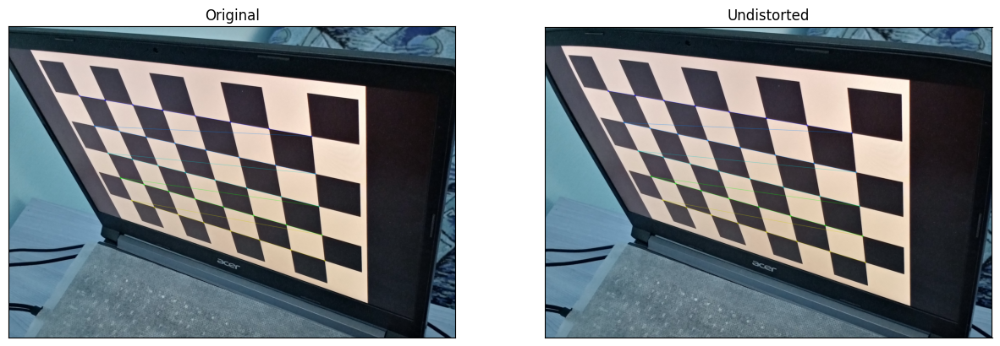

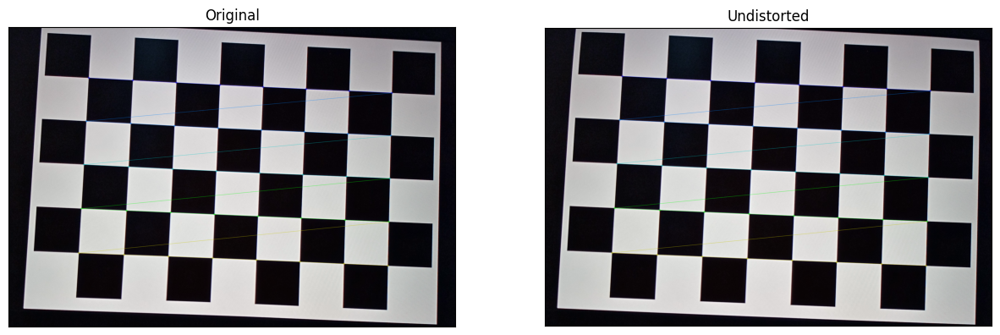

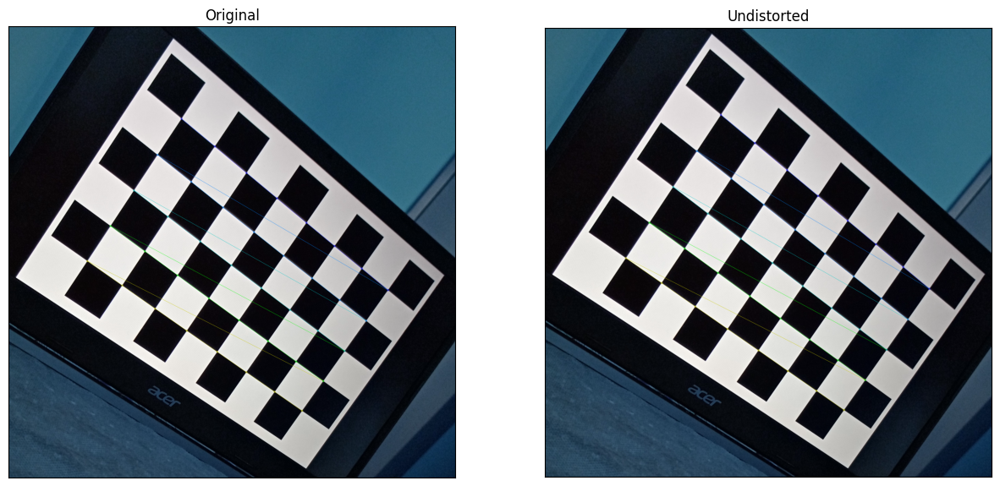

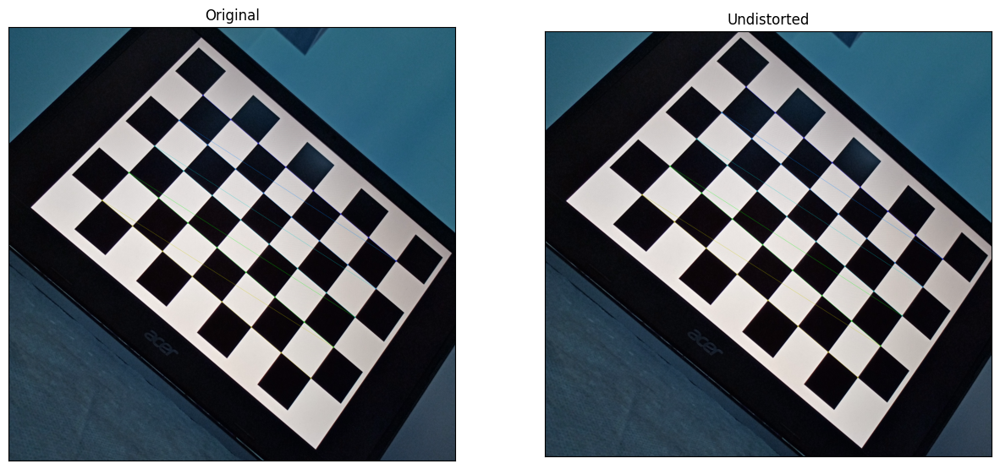

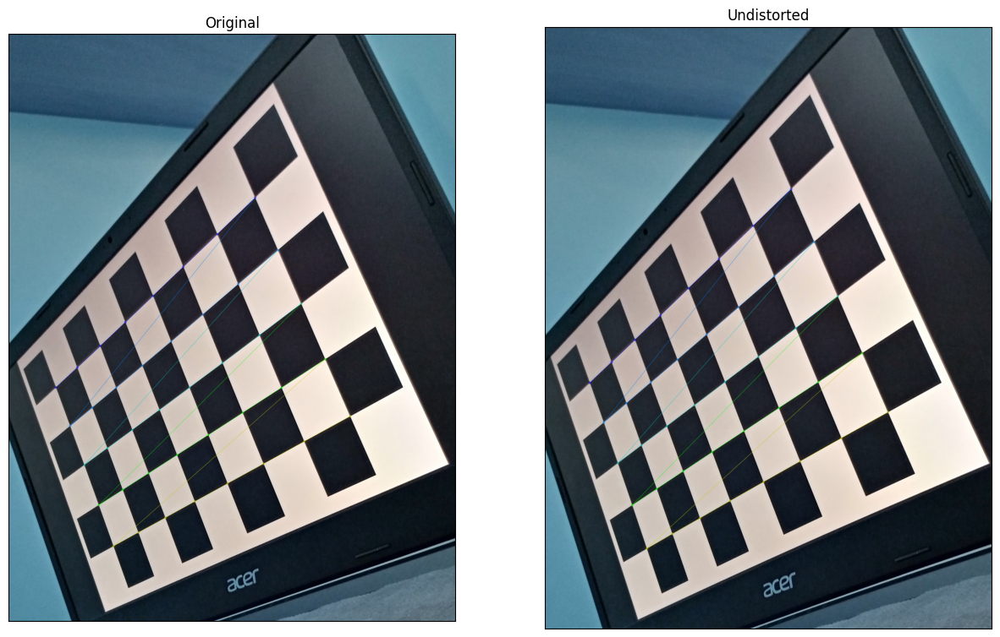

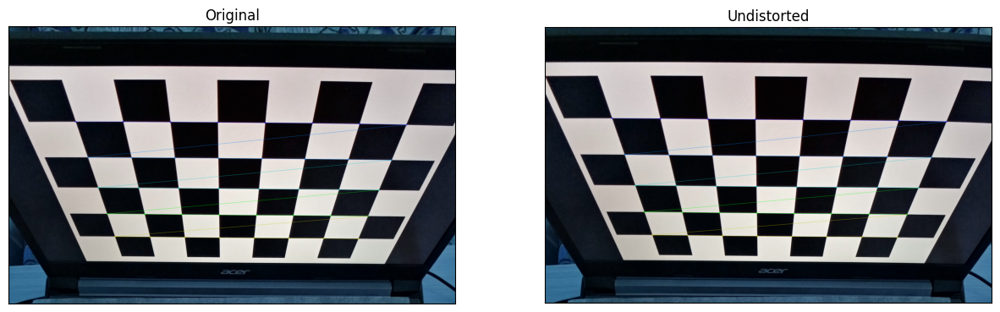

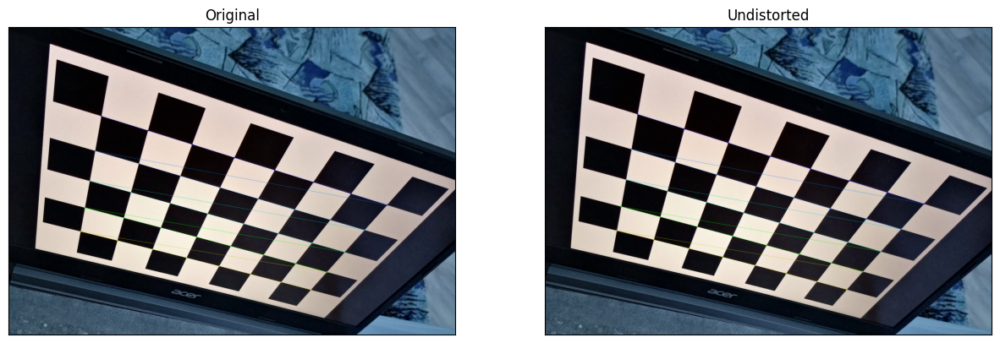

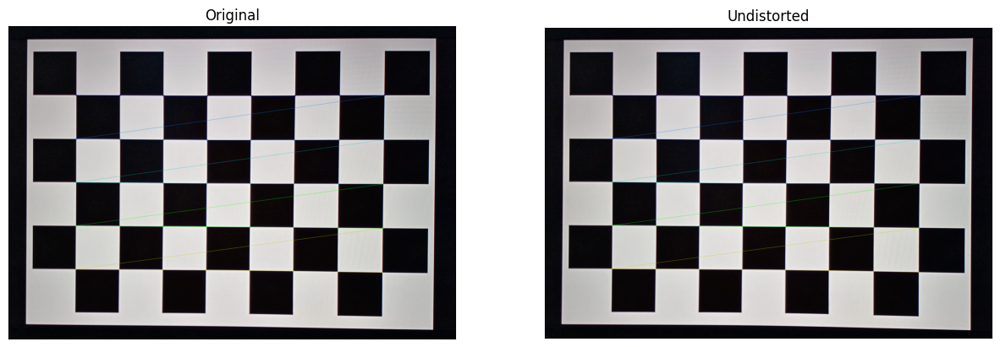

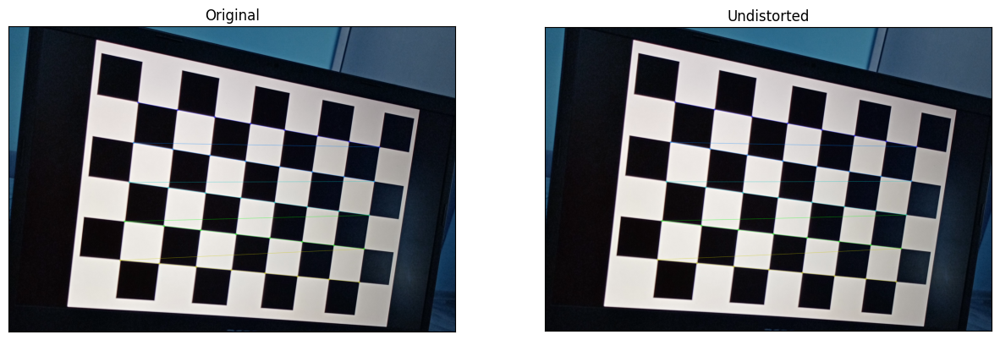

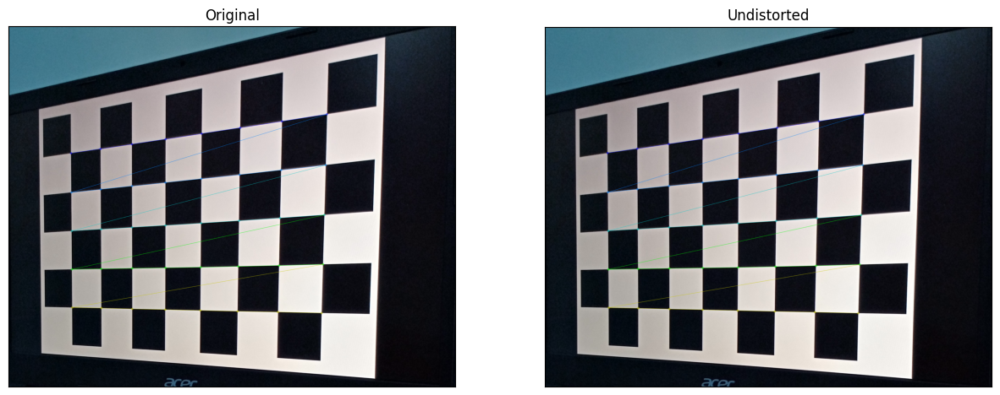

In [18]:
# your code

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0, 0, 0), (1, 0, 0), (2, 0, 0) ....,(6, 5, 0)
objp = np.zeros((5 * 8, 3), np.float32)
objp[:, :2] = np.mgrid[0:8, 0:5].T.reshape(-1, 2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
m = []
d = []
err = []

for i in range(10):
    # img = cv2.imread(f"/content/data/calibr_images/img_{i}.jpg")
    img = cv2.imread(f"data/calibr_images/img_{i}.jpg")
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (8, 5), None)

    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray,corners, (17, 11), (-1, -1), criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (8, 5), corners2, ret)

        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints,
                                                          gray.shape[::-1], None,
                                                          None)
        m.append(mtx)
        d.append(dist)
        h, w = img.shape[:2]
        newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w, h), 1, (w, h))
        # undistort
        dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

        # crop the image
        x, y, w, h = roi
        dst = dst[y:y+h, x:x+w]

        mean_error = 0
        for i in range(len(objpoints)):
            imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
            error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2) / len(imgpoints2)
            mean_error += error

        err.append(mean_error / len(objpoints))

        plt.figure(figsize=(15, 30))

        plt.subplot(121)
        plt.imshow(img, cmap="gray")
        plt.xticks([])
        plt.yticks([])
        plt.title("Original")

        plt.subplot(122)
        plt.imshow(dst, cmap="gray")
        plt.xticks([])
        plt.yticks([])
        plt.title("Undistorted")

In [19]:
np.std(m, axis=0), np.std(d, axis=0), np.std(err, axis=0)

(array([[133.07270912,   0.        , 138.57550967],
        [  0.        , 117.68509593, 259.67528116],
        [  0.        ,   0.        ,   0.        ]]),
 array([[0.12471397, 0.61853797, 0.01106442, 0.00759384, 1.32936913]]),
 0.29466677499417165)

In [20]:
np.set_printoptions(suppress=True)
print(f"""Средние параметры intrinsic матрицы:
{np.mean(m, axis=0)}

Средние парметры дисторсии:
{np.array(d).reshape(10, 5).mean(axis=0)}

Средняя ошибка репроектирования:
{np.mean(err, axis=0)}""")

Средние параметры intrinsic матрицы: 
[[3374.41359077    0.         1390.3744248 ]
 [   0.         3413.52384471 1845.14892753]
 [   0.            0.            1.        ]]
      
Средние парметры дисторсии: 
[-0.00708672 -0.17831453 -0.0050598   0.00260407  0.56989268]
      
Средняя ошибка репроектирования: 
0.5761636616439783
